<a href="https://colab.research.google.com/github/Rezi277/Latihan11-ML/blob/main/Latihan11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install geopandas contextily shapely

In [ ]:
!pip install folium

In [ ]:
!pip install contextily

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import folium
from folium.plugins import HeatMap
import geopandas as gpd
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely import wkt

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Latihan-2.ML/Praktikum11.ML/Data/katalog_gempa.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92887 entries, 0 to 92886
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   tgl      92887 non-null  object 
 1   ot       92887 non-null  object 
 2   lat      92887 non-null  float64
 3   lon      92887 non-null  float64
 4   depth    92887 non-null  int64  
 5   mag      92887 non-null  float64
 6   remark   92887 non-null  object 
 7   strike1  2735 non-null   float64
 8   dip1     2735 non-null   float64
 9   rake1    2735 non-null   float64
 10  strike2  2735 non-null   float64
 11  dip2     2735 non-null   float64
 12  rake2    2735 non-null   float64
dtypes: float64(9), int64(1), object(3)
memory usage: 9.2+ MB


In [ ]:
df.head()

,tgl,ot,lat,lon,depth,mag,remark,strike1,dip1,rake1,strike2,dip2,rake2
0,2008/11/01,21:02:43.058,-9.18,119.06,10,4.9,Sumba Region - Indonesia,NaN,NaN,NaN,NaN,NaN,NaN
1,2008/11/01,20:58:50.248,-6.55,129.64,10,4.6,Banda Sea,NaN,NaN,NaN,NaN,NaN,NaN
2,2008/11/01,17:43:12.941,-7.01,106.63,121,3.7,Java - Indonesia,NaN,NaN,NaN,NaN,NaN,NaN
3,2008/11/01,16:24:14.755,-3.30,127.85,10,3.2,Seram - Indonesia,NaN,NaN,NaN,NaN,NaN,NaN
4,2008/11/01,16:20:37.327,-6.41,129.54,70,4.3,Banda Sea,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.isnull().sum()

,0
tgl,0
ot,0
lat,0
lon,0
depth,0
mag,0
remark,0
strike1,90152
dip1,90152
rake1,90152


In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
peta_indonesia = folium.Map(location=[-2.548926, 118.014863], zoom_start=5)

# Buat list data [lat, lon, value] untuk heatmap
# Menggunakan kolom 'mag' sebagai nilai heatmap
data_heatmap = df[['lat', 'lon', 'mag']].values.tolist()

# Tambahkan heatmap ke peta
HeatMap(data_heatmap, radius=12, blur=15, max_zoom=6).add_to(peta_indonesia)

# Tampilkan peta
peta_indonesia

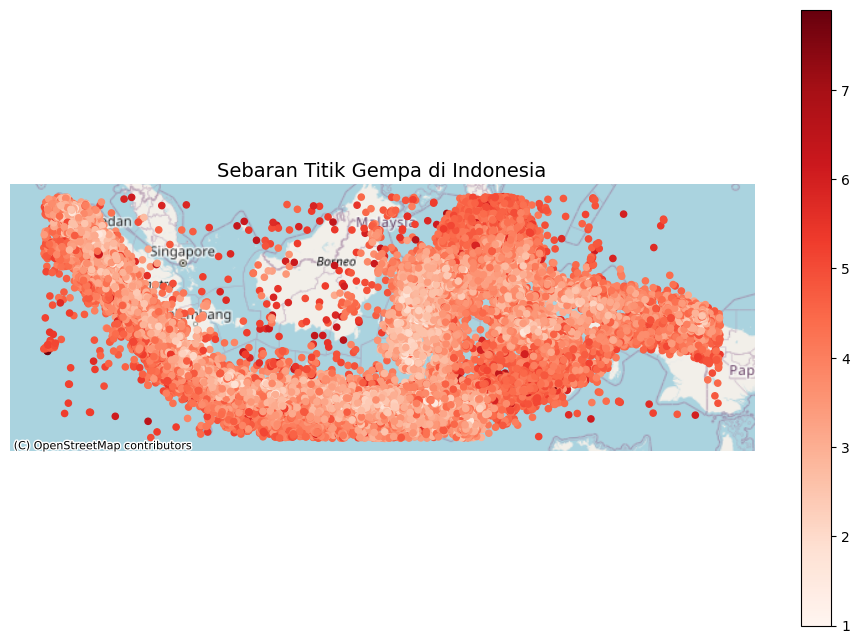

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

# Jitter koordinat agar tidak tumpang tindih
np.random.seed(42)
lon_peta = df['lon'] + np.random.uniform(-0.05, 0.05, size=len(df))
lat_peta  = df['lat']  + np.random.uniform(-0.05, 0.05, size=len(df))

# Konversi ke GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(lon_peta, lat_peta),
    crs='EPSG:4326'
)

# Proyeksi ke Web Mercator
gdf = gdf.to_crs(epsg=3857)

persentasekatalog_gempa = df.groupby("remark")["lat"].mean()
top_5 = persentasekatalog_gempa.sort_values(ascending=False).head(5)
bottom_5 = persentasekatalog_gempa.sort_values().head(5)

fig, ax = plt.subplots(figsize=(12, 8))

#Plot titik data (pakai magnitude sebagai warna)
gdf.plot(
    ax=ax,
    column="mag",      # warna berdasarkan magnitude (menggunakan 'mag' bukan 'magnitude')
    cmap="Reds",             # colormap
    markersize=20,
    legend=True              # munculkan legend
)

#Tambahkan basemap (OpenStreetMap)
ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

#hapusaxis
ax.set_axis_off()
plt.title("Sebaran Titik Gempa di Indonesia", fontsize=14)
plt.show()

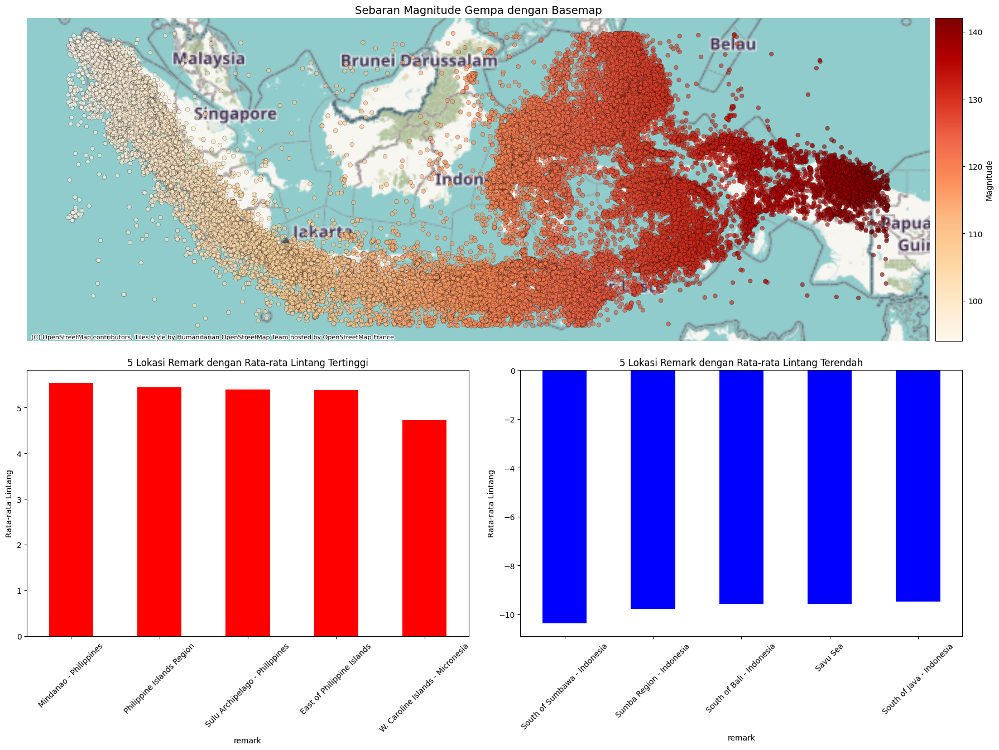

In [ ]:
# Buat layout dengan GridSpec
fig = plt.figure(figsize=(18, 14))
gs = gridspec.GridSpec(2, 2, height_ratios=[3, 2])

# --- Row 1: Peta sebaran (colspan=2) ---
ax_map = plt.subplot(gs[0, :])
divider = make_axes_locatable(ax_map)
cax = divider.append_axes("right", size="3%", pad=0.1)

gdf.plot(
    ax=ax_map,
    column='lon', # Changed from 'Persentase katalog gempa' to 'mag'
    cmap='OrRd',
    legend=True,
    legend_kwds={'label': 'Magnitude', 'orientation': 'vertical'}, # Updated label
    cax=cax,
    markersize=30,
    edgecolor='black',
    linewidth=0.3,
    alpha=0.6
)

ctx.add_basemap(ax_map)
ax_map.set_title("Sebaran Magnitude Gempa dengan Basemap", fontsize=14) # Updated title
ax_map.axis('off')

# --- Row 2: Bar chart top & bottom (stacked vertically di satu kolom) ---
ax_top = plt.subplot(gs[1, 0])
bars_top = top_5.plot(kind='bar', ax=ax_top, color='red')
ax_top.set_title("5 Lokasi Remark dengan Rata-rata Lintang Tertinggi") # Updated title
ax_top.set_ylabel("Rata-rata Lintang") # Updated label
ax_top.set_xlabel("remark")
ax_top.tick_params(axis='x', rotation=45)

ax_bottom = plt.subplot(gs[1, 1])
bars_bottom = bottom_5.plot(kind='bar', ax=ax_bottom, color='blue')
ax_bottom.set_title("5 Lokasi Remark dengan Rata-rata Lintang Terendah") # Updated title
ax_bottom.set_ylabel("Rata-rata Lintang") # Updated label
ax_bottom.set_xlabel("remark")
ax_bottom.tick_params(axis='x', rotation=45)

plt.tight_layout() # Add tight layout for better spacing
plt.show()

In [ ]:
for i, val in enumerate(bottom_5):
    ax_bottom.text(i, val + 0.2, f"{val:.2f}%", ha='center', va='bottom', fontsize=9)

# Sinkronisasi skala y kedua chart
max_val = max(top_5.max(), bottom_5.max())
ax_top.set_ylim(0, max_val + 1)

max_val = max(top_5.max(), bottom_5.max())
ax_bottom.set_ylim(0, max_val + 1)

plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
df.columns

Index(['tgl', 'ot', 'lat', 'lon', 'depth', 'mag', 'remark', 'strike1', 'dip1',
       'rake1', 'strike2', 'dip2', 'rake2'],
      dtype='object')

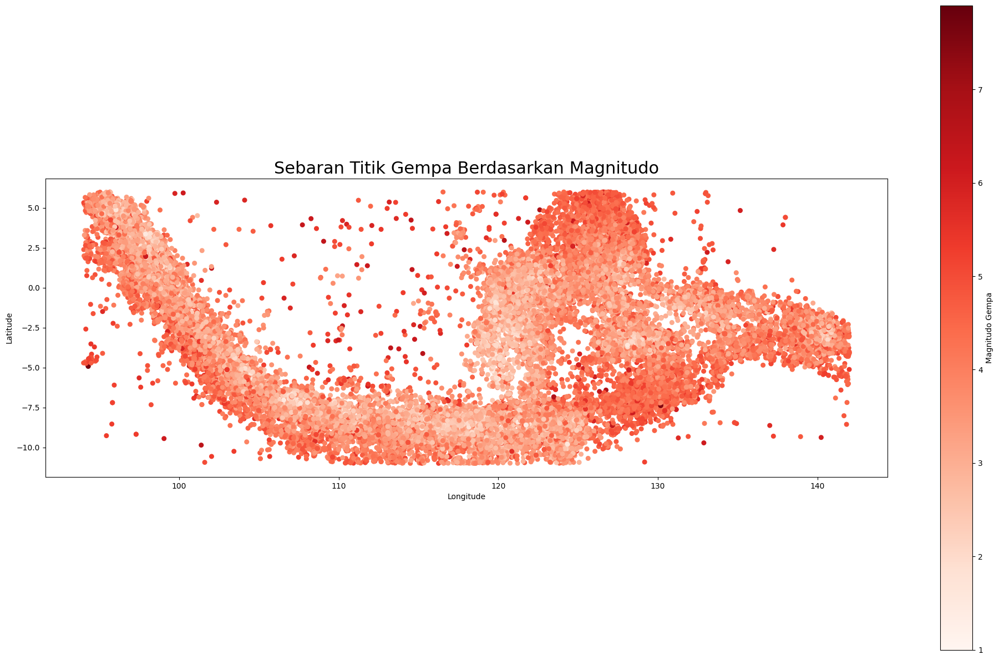

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Normalisasi nama kolom jika diperlukan
df.columns = df.columns.str.strip().str.lower()

# Membuat geometry dari lat dan lon
geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]

gdf = gpd.GeoDataFrame(df, geometry=geometry)

fig, ax = plt.subplots(figsize=(20, 12))

# Plot titik berdasarkan magnitudo (mag)
gdf.plot(
    column='mag',
    cmap='Reds',
    markersize=30,
    legend=True,
    ax=ax,
    legend_kwds={
        'label': 'Magnitudo Gempa',
        'orientation': 'vertical'
    }
)

ax.set_title("Sebaran Titik Gempa Berdasarkan Magnitudo", fontsize=22)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import shapiro

normalityTest_df = df.drop(columns=['tgl', 'ot', 'remark'])

normalityTest_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92887 entries, 0 to 92886
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   lat      92887 non-null  float64
 1   lon      92887 non-null  float64
 2   depth    92887 non-null  int64  
 3   mag      92887 non-null  float64
 4   strike1  2735 non-null   float64
 5   dip1     2735 non-null   float64
 6   rake1    2735 non-null   float64
 7   strike2  2735 non-null   float64
 8   dip2     2735 non-null   float64
 9   rake2    2735 non-null   float64
dtypes: float64(9), int64(1)
memory usage: 7.1 MB


In [ ]:
stat, p = shapiro(normalityTest_df)

print("Statik: ", stat)
print("P-value: ", p)

if p > 0.05:
  print("Data distribusi normal (tidak tolak H0)")
else:
  print("Data tidak berdistribusi normal (tolak H0)")

Statik:  nan
P-value:  nan
Data tidak berdistribusi normal (tolak H0)


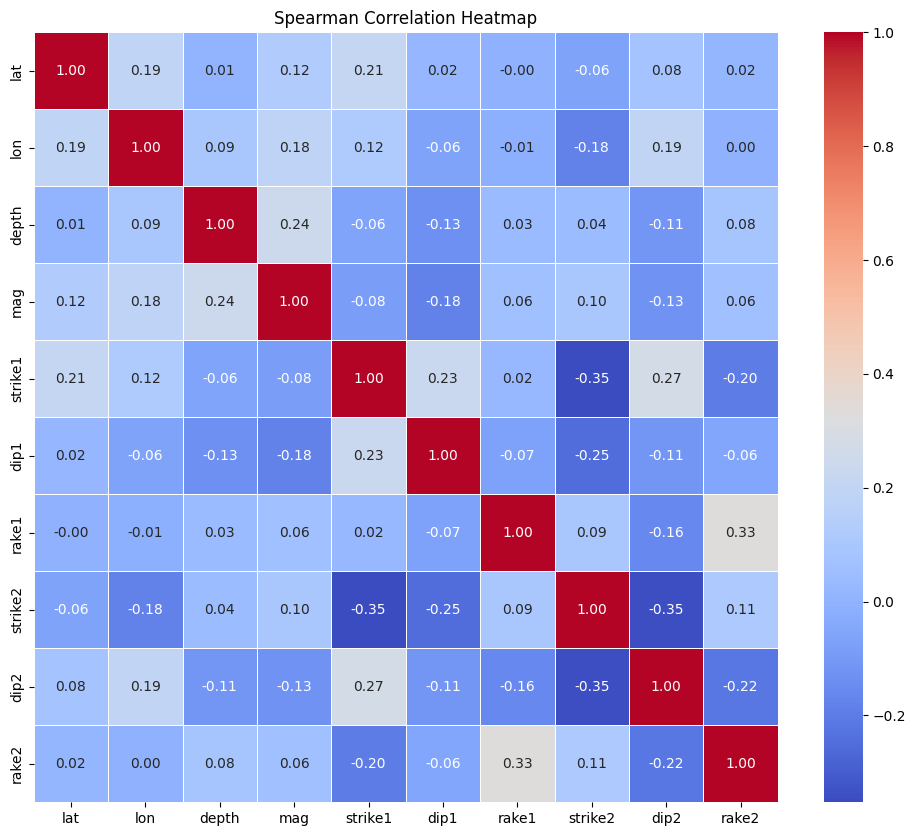

In [ ]:
correlation_df = normalityTest_df

correlation_matrix = correlation_df.corr(method='spearman')

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Spearman Correlation Heatmap")
plt.show()

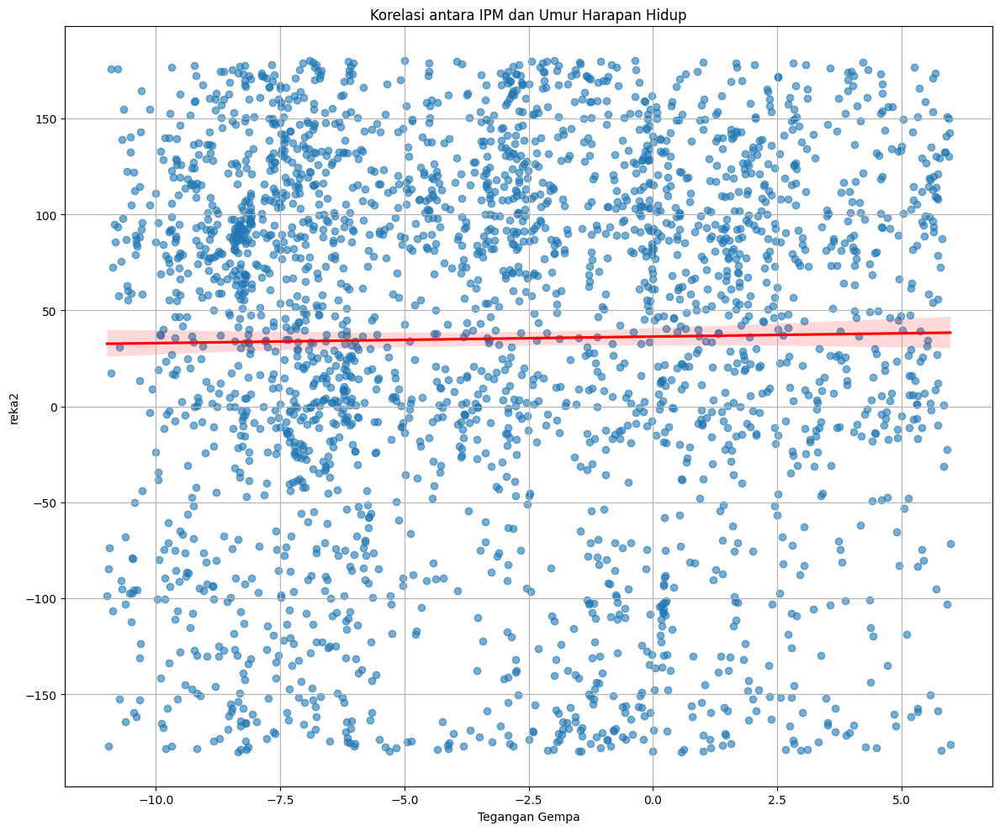

In [ ]:
plt.figure(figsize=(12, 10))
sns.regplot(
    x="lat",
    y="rake2",
    data=df,
    scatter_kws={'alpha':0.6},
    line_kws={'color':'red'}
)
plt.title("Korelasi antara IPM dan Umur Harapan Hidup")
plt.xlabel("Tegangan Gempa")
plt.ylabel("reka2")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
normalisasi_df = df.drop(columns=['tgl', 'ot', 'remark'])

normalisasi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92887 entries, 0 to 92886
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   lat      92887 non-null  float64
 1   lon      92887 non-null  float64
 2   depth    92887 non-null  int64  
 3   mag      92887 non-null  float64
 4   strike1  2735 non-null   float64
 5   dip1     2735 non-null   float64
 6   rake1    2735 non-null   float64
 7   strike2  2735 non-null   float64
 8   dip2     2735 non-null   float64
 9   rake2    2735 non-null   float64
dtypes: float64(9), int64(1)
memory usage: 7.1 MB


In [ ]:
from sklearn.preprocessing import RobustScaler

column_names = normalisasi_df.columns

scaler = RobustScaler()

normalisasi_df = scaler.fit_transform(normalisasi_df)

normalisasi_df = pd.DataFrame(normalisasi_df, columns=column_names)

normalisasi_df.head()

,lat,lon,depth,mag,strike1,dip1,rake1,strike2,dip2,rake2
0,-0.781308,-0.152950,-0.136364,1.166667,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.453583,0.617626,-0.136364,0.916667,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.510903,-1.058267,2.386364,0.166667,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.048598,0.487254,-0.136364,-0.250000,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.436137,0.610342,1.227273,0.666667,NaN,NaN,NaN,NaN,NaN,NaN


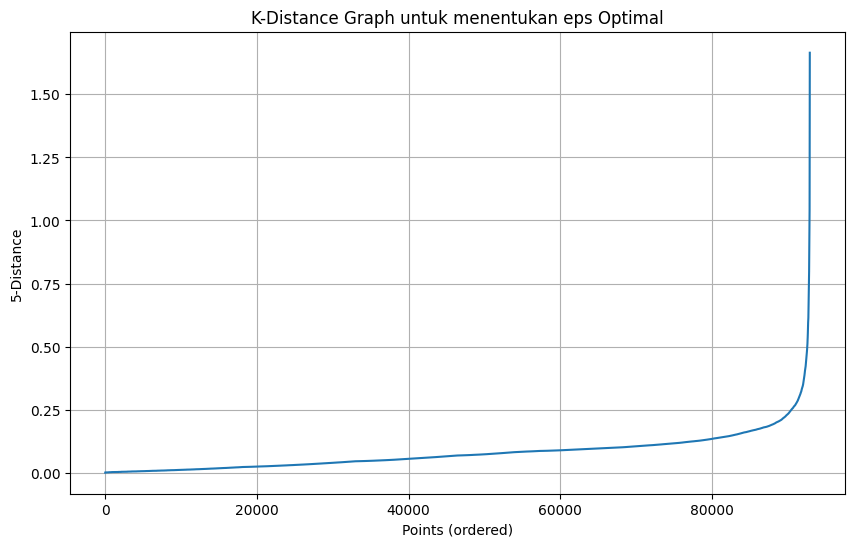

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Gunakan data hasil normalisasi, filter kolom tanpa NaN untuk NearestNeighbors
# Berdasarkan normalisasi_df.info(), 'lat', 'lon', 'depth', 'mag' tidak memiliki NaN
X = normalisasi_df[['lat', 'lon', 'depth', 'mag']].values

# Tentukan jumlah tetangga (min_samples biasanya = 4-10)
k = 5

# Fit nearest neighbors
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

# Ambil jarak tetangga ke-k (k-distance)
k_distances = np.sort(distances[:, k-1])

# Plot k-distance graph
plt.figure(figsize=(10, 6))
plt.plot(k_distances)
plt.title("K-Distance Graph untuk menentukan eps Optimal")
plt.ylabel(f"{k}-Distance")
plt.xlabel("Points (ordered)")
plt.grid(True)
plt.show()

In [ ]:
from sklearn.cluster import DBSCAN

# Select only the columns from normalisasi_df that do not contain NaN values
# These columns were identified as 'lat', 'lon', 'depth', 'mag' from previous info() calls
X_for_dbscan = normalisasi_df[['lat', 'lon', 'depth', 'mag']].values

dbscan = DBSCAN(eps=0.2, min_samples=5)
labels = dbscan.fit_predict(X_for_dbscan)

df["Cluster_DBSCAN"] = labels
print(df["Cluster_DBSCAN"].value_counts())

Cluster_DBSCAN
 0     89183
-1      2771
 3       202
 8       119
 7        26
       ...  
 63        4
 58        4
 39        4
 75        4
 42        2
Name: count, Length: 77, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

mask = labels != -1  # hilangkan noise
score = silhouette_score(normalisasi_df[['lat', 'lon', 'depth', 'mag']][mask], labels[mask])

print(f"Silhouette Score: {score}")

Silhouette Score: -0.48802296223672587


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


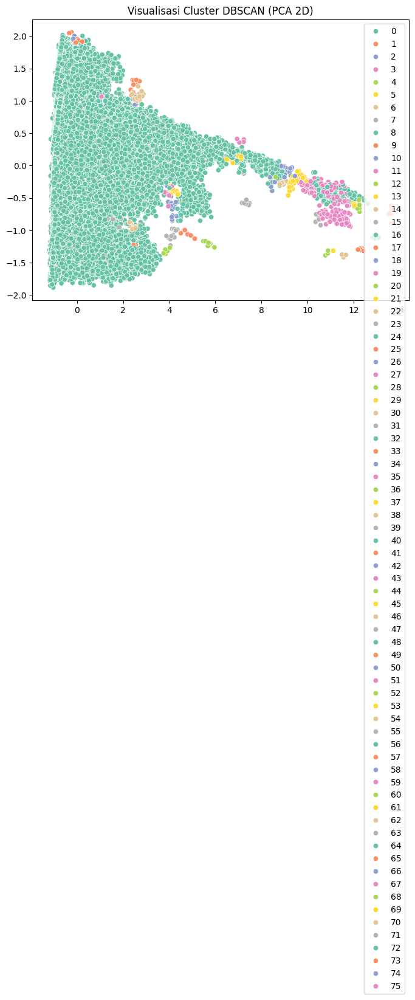

In [ ]:
from sklearn.decomposition import PCA

# Select only the columns from normalisasi_df that do not contain NaN values for PCA
# These are the same columns used for DBSCAN: 'lat', 'lon', 'depth', 'mag'
X_for_pca = normalisasi_df[['lat', 'lon', 'depth', 'mag']].values

pca = PCA(n_components=2)
reduced = pca.fit_transform(X_for_pca)

plt.figure(figsize=(8,6))
sns.scatterplot(x=reduced[mask, 0], y=reduced[mask, 1], hue=labels[mask], palette="Set2") # Apply mask to labels for consistency
plt.title("Visualisasi Cluster DBSCAN (PCA 2D)")
plt.show()

In [ ]:
def klasifikasi_db(x):
  if x == 0:
    return "Baik"
  elif x == -1:
    return "Noise"
  else:
    return "Buruk"

df["Klasifikasi_DBSCAN"] = df["Cluster_DBSCAN"].apply(klasifikasi_db)

print(df["Klasifikasi_DBSCAN"].value_counts())

Klasifikasi_DBSCAN
Buruk    92887
Name: count, dtype: int64


In [ ]:
clustter_summary_db = df.drop(columns=['tgl', 'ot', 'remark']).groupby("Klasifikasi_DBSCAN").mean(numeric_only=True)
clustter_summary_db

,lat,lon,depth,mag,strike1,dip1,rake1,strike2,dip2,rake2
Klasifikasi_DBSCAN,,,,,,,,,,
Buruk,-3.404577,119.159707,49.009399,3.592788,170.142852,60.202121,30.358062,197.450303,56.576344,35.250018


In [ ]:
# Data untuk hover
import plotly.express as px

df_pca_db = pd.DataFrame(reduced, columns=["PCA 1", "PCA 2"])
df_pca_db["Klasifikasi_DBSCAN"] = df["Klasifikasi_DBSCAN"].values
# Use 'remark' column for hover_name as 'Kabupaten/Kota' does not exist
df_pca_db["Remark"] = df["remark"].values

# Plotly interaktif
fig = px.scatter(
    df_pca_db,
    x="PCA 1",
    y="PCA 2",
    color="Klasifikasi_DBSCAN",
    hover_name="Remark",
    title="Persebaran Data Berdasarkan Klasifikasi (DBSCAN)",
    width=1500,
    height=900
)

fig.show()